# Table of Contents
1. Introduction
2. Import
3. Analysis & Preprocessing
4. Model
5. Training
6. Analysis & Conclusion

# 1. Introduction
 `Notes: PNG and TIFF images were removed from the dataset to only use JPEG images for consistency`

Using **heavily adapted and simplified version** of VGG-16 https://towardsdatascience.com/step-by-step-vgg16-implementation-in-keras-for-beginners-a833c686ae6c
The following details are taken from the link above: 

The following are the layers of the model:

- Convolutional Layers = 13
- Pooling Layers = 5
- Dense Layers = 3

### Model Layers

1. **Input: Image of dimensions (224, 224, 3).**
2. **Convolution Layer Conv1:**
    - Conv1-1: 64 filters
    - Conv1-2: 64 filters and Max Pooling
    - Image dimensions: (224, 224)
3. **Convolution layer Conv2: Now, we increase the filters to 128**
    - Input Image dimensions: (112,112)
    - Conv2-1: 128 filters
    - Conv2-2: 128 filters and Max Pooling
4. **Convolution Layer Conv3: Again, double the filters to 256, and now add another convolution layer**
    - Input Image dimensions: (56,56)
    - Conv3-1: 256 filters
    - Conv3-2: 256 filters
    - Conv3-3: 256 filters and Max Pooling
5. **Convolution Layer Conv4: Similar to Conv3, but now with 512 filters**
    - Input Image dimensions: (28, 28)
    - Conv4-1: 512 filters
    - Conv4-2: 512 filters
    - Conv4-3: 512 filters and Max Pooling
6. **Convolution Layer Conv5: Same as Conv4**
    - Input Image dimensions: (14, 14)
    - Conv5-1: 512 filters
    - Conv5-2: 512 filters
    - Conv5-3: 512 filters and Max Pooling
    - The output dimensions here are (7, 7). At this point, we flatten the output of this layer to generate a feature vector
7. **Fully Connected/Dense FC1: 4096 nodes, generating a feature vector of size(1, 4096)**
8. **Fully ConnectedDense FC2: 4096 nodes generating a feature vector of size(1, 4096)**
9. **Fully Connected /Dense FC3: 4096 nodes, generating 1000 channels for 1000 classes. This is then passed on to a Softmax activation function**
10. **Output layer**

# 2. Import

On MacOS for M1 chip, I had many issues with Tensorflow. In my environment I had to ensure I had the following installed:

- python -m pip install tensorflow-macos
- python -m pip install tensorflow-metal

In [1]:
import numpy as np

In [2]:
import pandas as pd

In [3]:
import tensorflow as tf

In [4]:
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import layers 
from keras import Model 
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam

from tensorflow.keras import utils, callbacks
# checkpoint will stop the model based on a parameter in training 
# earlyStopping to stop training in accuracy stops increasing

In [5]:
import matplotlib.pyplot as plt
import os
from pylab import *
import shutil #for split into train, val, test
import random
import seaborn as sns #visualizing the data
import sklearn as sk
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, f1_score

# 3. Analysis & Preprocessing

The following cell should only be ran ONCE! 

In [6]:
class_dir = ['Healthy', 'Brain_Tumor'] #labels

# source 1: https://www.geeksforgeeks.org/python-shutil-copy-method/
# source 2: https://www.kaggle.com/questions-and-answers/102677

# directory for images (jpg)
root_dir = 'data/Brain_Tumor/imageData/' # data root path

val_ratio = 0.15 # 15% of total images -> val  
test_ratio = 0.05 # 5% of total images -> test

for cls in class_dir:
    os.makedirs(root_dir +'train/' + cls)
    os.makedirs(root_dir +'val/' + cls)
    os.makedirs(root_dir +'test/' + cls)

    # Creating partitions of the data after shuffeling
    src = root_dir + cls # Folder to copy images from
    allFileNames = os.listdir(src)
    np.random.shuffle(allFileNames)
    train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                          [int(len(allFileNames)* (1 - (val_ratio + test_ratio))), 
                                                           int(len(allFileNames)* (1 - test_ratio))])

    train_FileNames = [src+'/'+ name for name in train_FileNames.tolist()]

    val_FileNames = [src+'/' + name for name in val_FileNames.tolist()]
    test_FileNames = [src+'/' + name for name in test_FileNames.tolist()]


    print("\n*****************************")
    print('Total images: ', len(allFileNames), cls)
    print('Training: ', len(train_FileNames), cls)
    print('Validation: ', len(val_FileNames), cls)
    print('Testing: ', len(test_FileNames), cls)
    print("*****************************")

    try:
        # Copy-pasting folders
        for name in train_FileNames:
            shutil.copy(name, root_dir +'train/' + cls)

        print("Train copied successfully.")

        for name in val_FileNames:
            shutil.copy(name, root_dir +'val/' + cls)

        print("Val copied successfully.")

        for name in test_FileNames:
            shutil.copy(name, root_dir +'test/' + cls)

        print("Test copied successfully.")

    # If source and destination are same
    except shutil.SameFileError:
        print("Source and destination represents the same file.")

    # if there is any permission issue
    except PermissionError:
        print("Permission denied.")

    # For other errors
    except:
        print("Error occurred while copying file.")
        
print("Successfully copied files")


*****************************
Total images:  2087 Healthy
Training:  1669 Healthy
Validation:  313 Healthy
Testing:  105 Healthy
*****************************
Train copied successfully.
Val copied successfully.
Test copied successfully.

*****************************
Total images:  2427 Brain_Tumor
Training:  1941 Brain_Tumor
Validation:  364 Brain_Tumor
Testing:  122 Brain_Tumor
*****************************
Train copied successfully.
Val copied successfully.
Test copied successfully.
Successfully copied files


In [70]:
b_size = 256 # batch size = 256

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        'data/Brain_Tumor/imageData/train',
        target_size=(150, 150),
        batch_size= b_size,
        class_mode='binary')
validation_generator = test_datagen.flow_from_directory(
        'data/Brain_Tumor/imageData/val',
        target_size=(150, 150),
        batch_size= b_size,
        class_mode='binary')
test_generator = test_datagen.flow_from_directory(
        'data/Brain_Tumor/imageData/test',
        target_size=(150, 150),
        batch_size= b_size,
        class_mode='binary')

Found 3608 images belonging to 2 classes.
Found 677 images belonging to 2 classes.
Found 227 images belonging to 2 classes.


In [8]:
#Expected: a batch of 256 images, image of size 224x224, 3 (rgb)
a, b = train_generator.next() 
print('Batch shape=%s, min=%.3f, max=%.3f' % (a.shape, a.min(), a.max()))
print('Num images = %s' % (b.shape))

Batch shape=(256, 150, 150, 3), min=0.000, max=1.000
Num images = 256


In [9]:
classes = train_generator.class_indices
classes

{'Brain_Tumor': 0, 'Healthy': 1}

<AxesSubplot:>

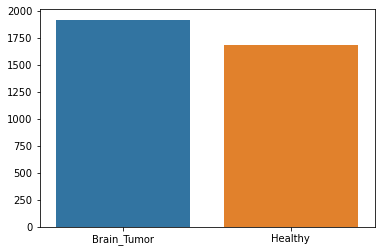

In [10]:
# Visualizing the train data in a bar chart
t=0
h=0
for i in range(15):
    a, b = next(train_generator)
    for j in b:
        if j == 1: # Brain Tumor
            h+=1
        else:t+=1

sns.barplot(x=['Brain_Tumor','Healthy'],y=[t,h])

Observations: Batch relatively balanced

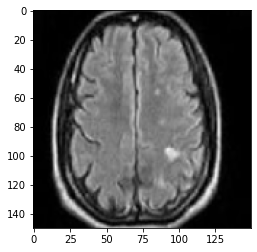

Healthy


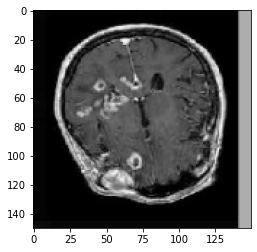

Brain Tumor


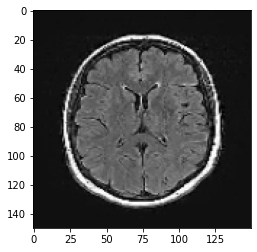

Healthy


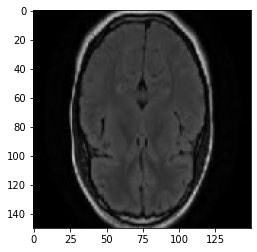

Healthy


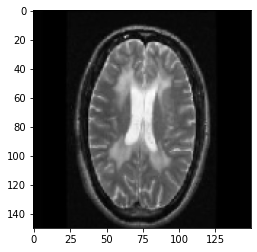

Healthy


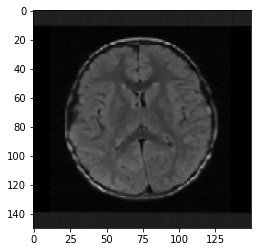

Healthy


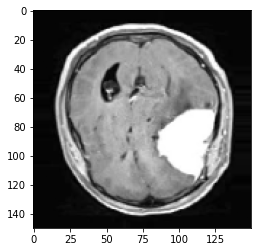

Brain Tumor


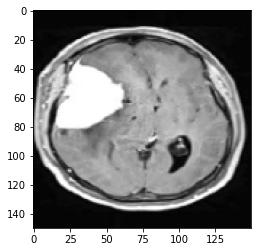

Brain Tumor


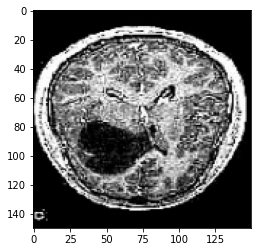

Brain Tumor


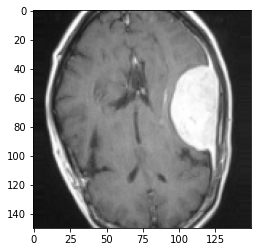

Brain Tumor


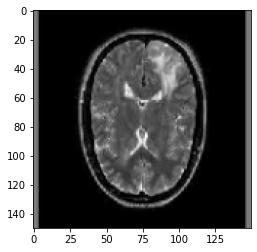

Healthy


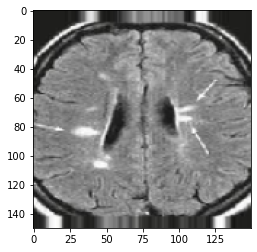

Healthy


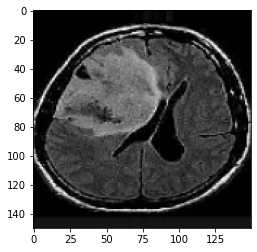

Brain Tumor


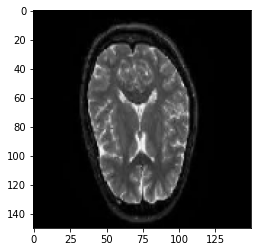

Healthy


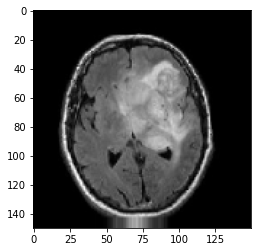

Brain Tumor


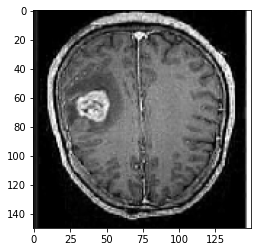

Brain Tumor


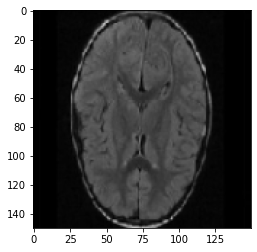

Healthy


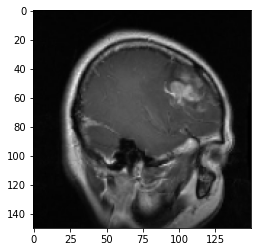

Brain Tumor


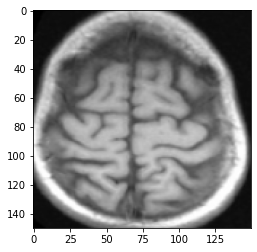

Healthy


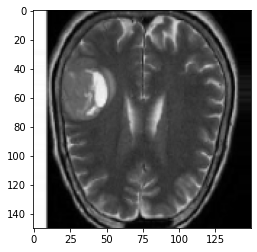

Brain Tumor


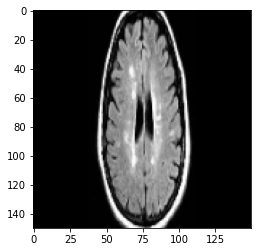

Healthy


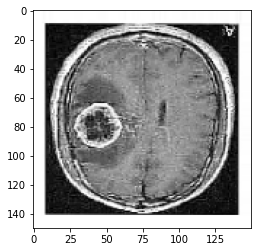

Brain Tumor


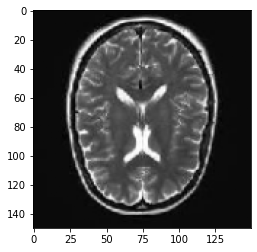

Healthy


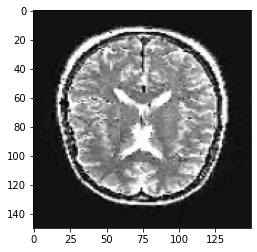

Healthy


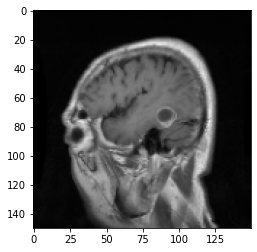

Brain Tumor


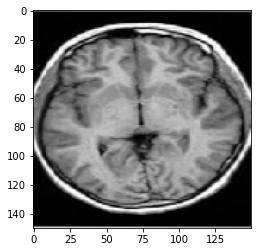

Healthy


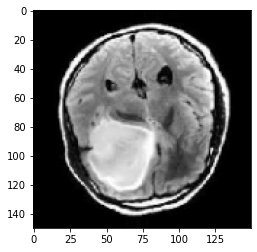

Brain Tumor


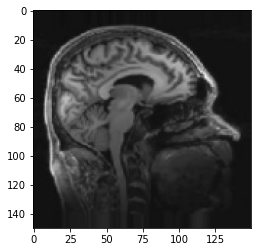

Healthy


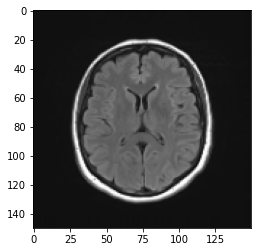

Healthy


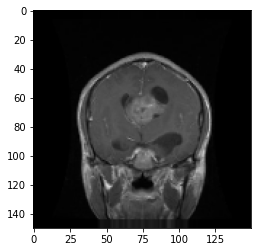

Brain Tumor


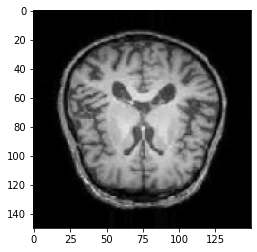

Healthy


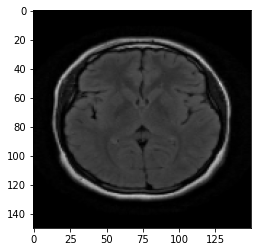

Healthy


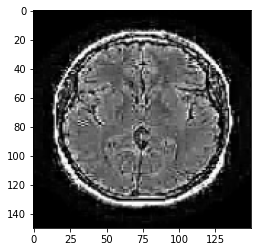

Healthy


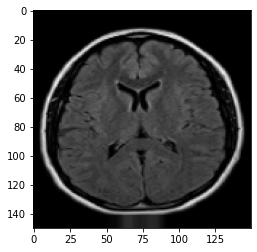

Healthy


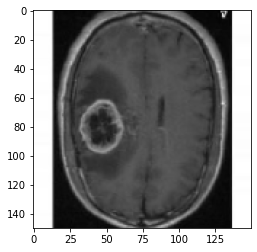

Brain Tumor


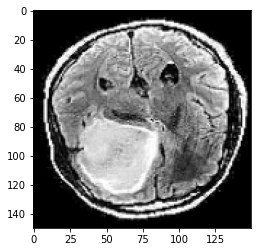

Brain Tumor


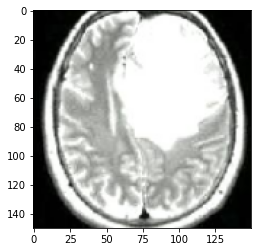

Brain Tumor


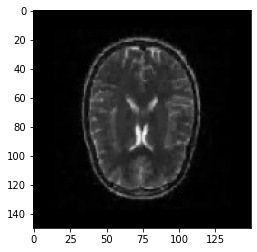

Healthy


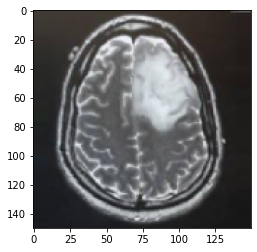

Brain Tumor


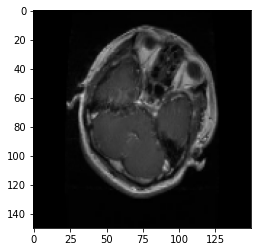

Brain Tumor


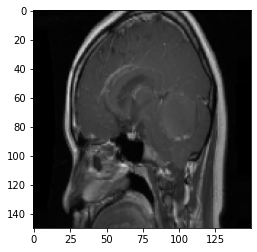

Brain Tumor


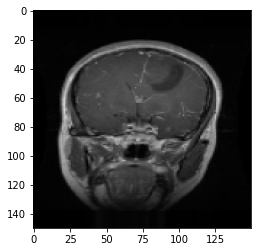

Brain Tumor


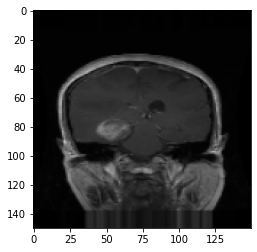

Brain Tumor


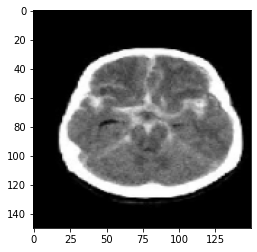

Healthy


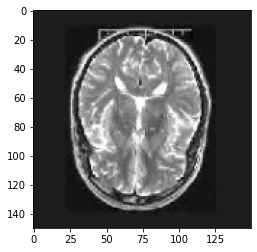

Healthy


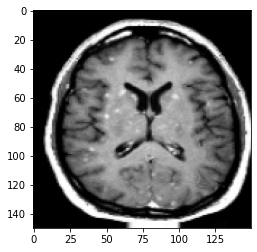

Healthy


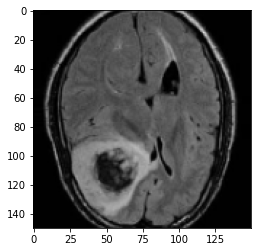

Brain Tumor


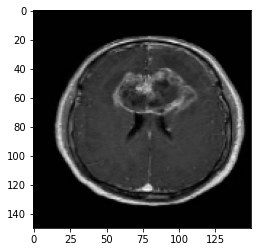

Brain Tumor


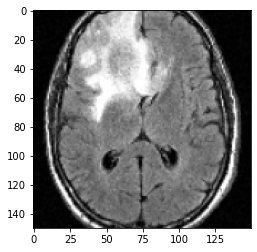

Brain Tumor


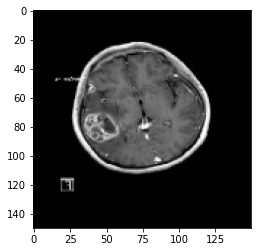

Brain Tumor


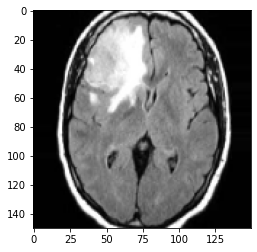

Brain Tumor


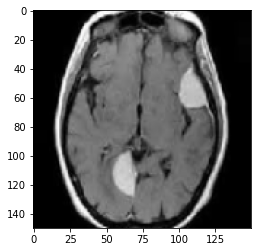

Brain Tumor


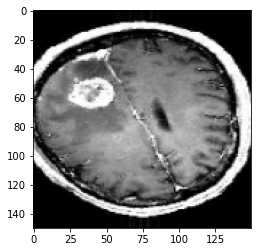

Brain Tumor


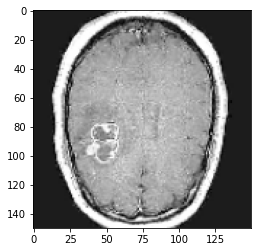

Brain Tumor


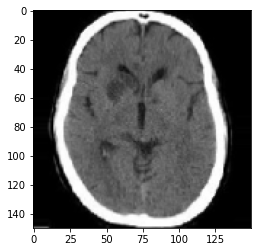

Healthy


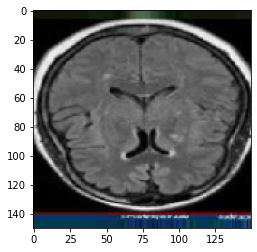

Healthy


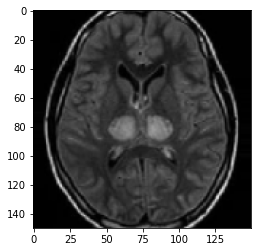

Healthy


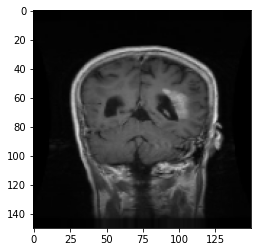

Brain Tumor


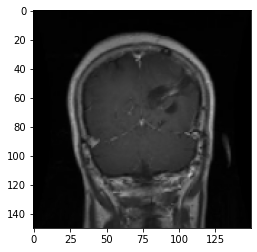

Brain Tumor


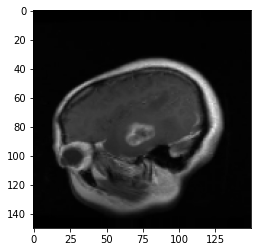

Brain Tumor


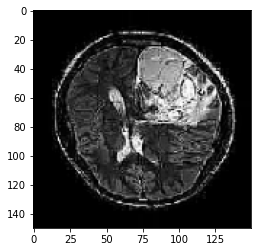

Brain Tumor


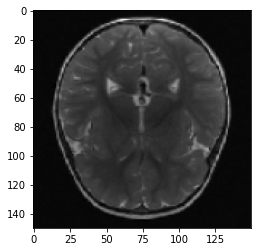

Healthy


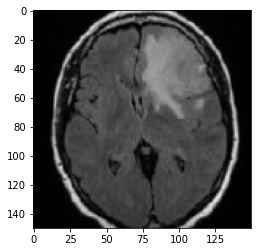

Brain Tumor


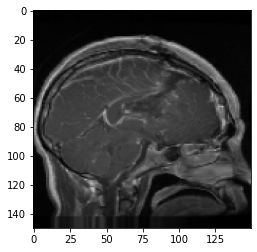

Brain Tumor


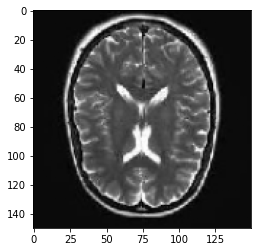

Healthy


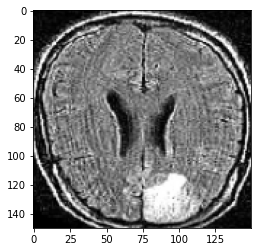

Brain Tumor


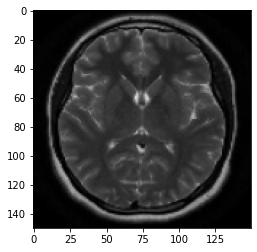

Healthy


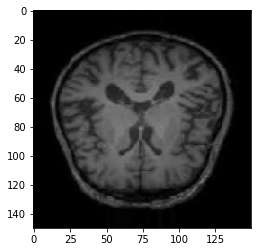

Healthy


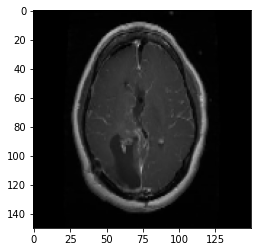

Brain Tumor


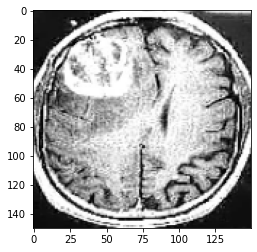

Brain Tumor


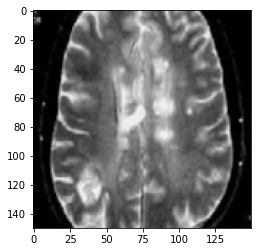

Healthy


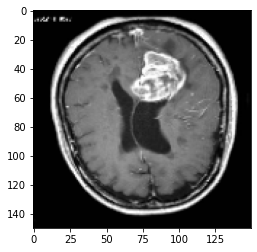

Brain Tumor


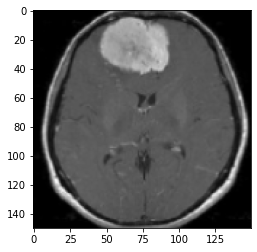

Brain Tumor


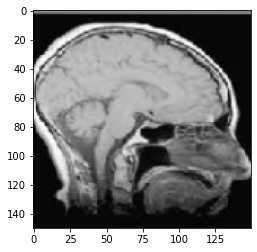

Healthy


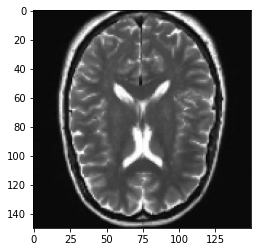

Healthy


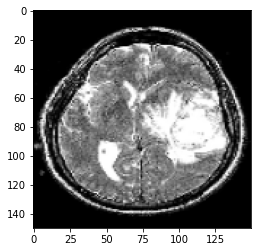

Brain Tumor


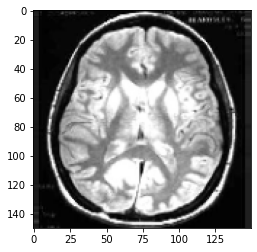

Brain Tumor


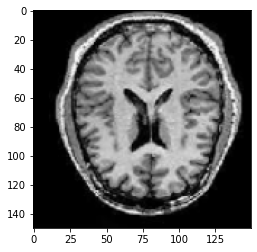

Healthy


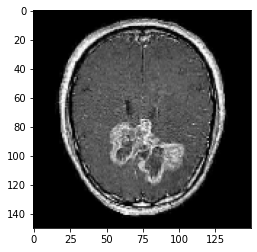

Brain Tumor


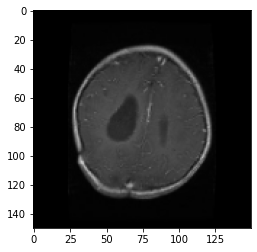

Brain Tumor


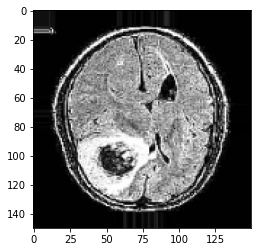

Brain Tumor


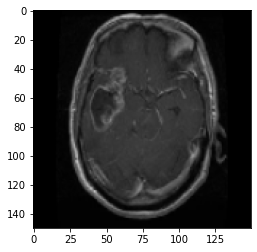

Brain Tumor


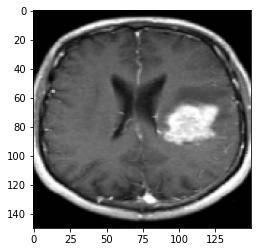

Brain Tumor


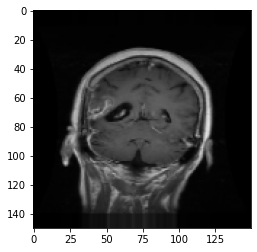

Brain Tumor


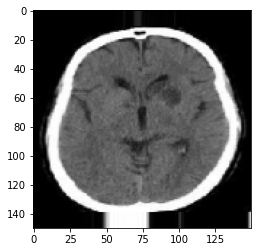

Healthy


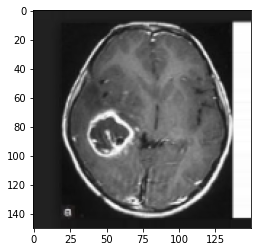

Brain Tumor


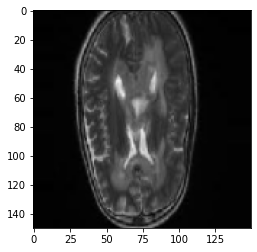

Healthy


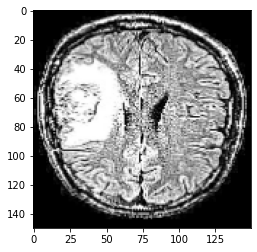

Brain Tumor


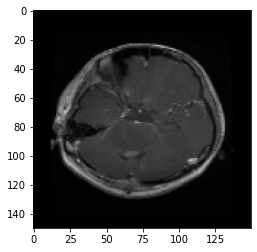

Brain Tumor


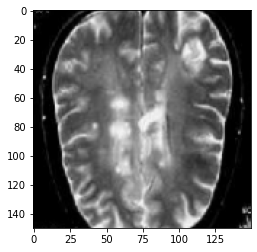

Healthy


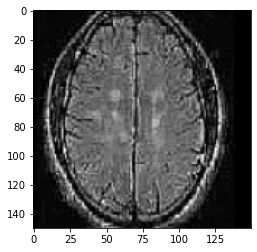

Healthy


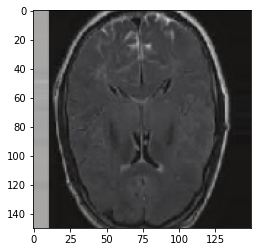

Healthy


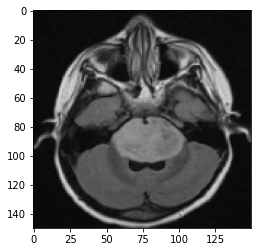

Brain Tumor


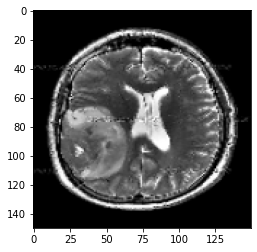

Brain Tumor


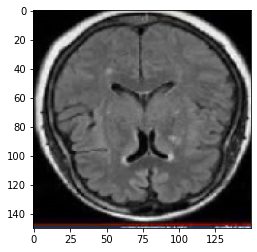

Healthy


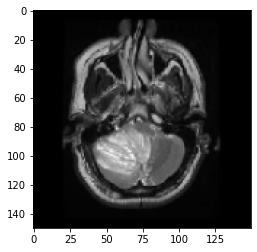

Healthy


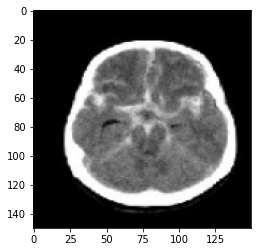

Healthy


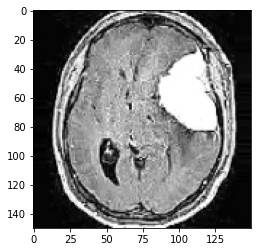

Brain Tumor


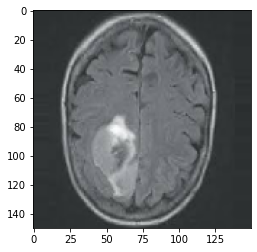

Brain Tumor


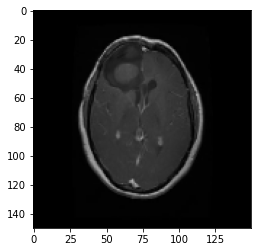

Brain Tumor


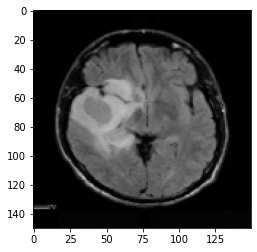

Brain Tumor


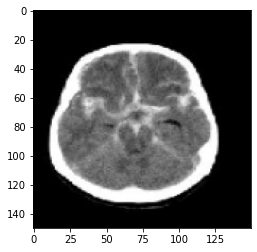

Healthy


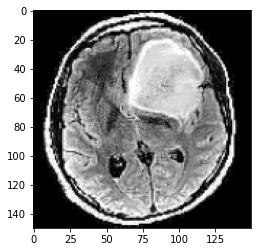

Brain Tumor


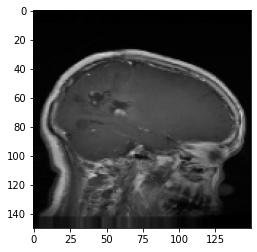

Brain Tumor


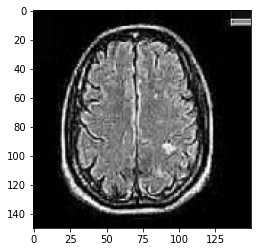

Healthy


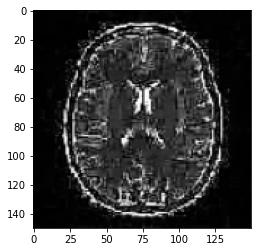

Healthy


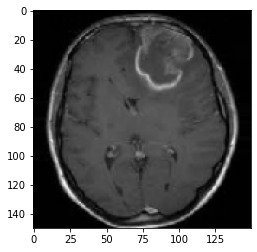

Brain Tumor


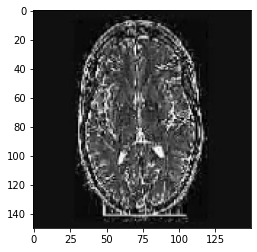

Healthy


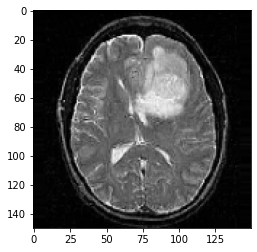

Brain Tumor


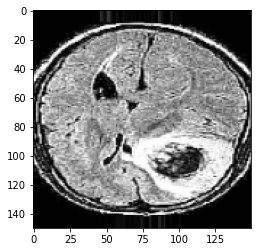

Brain Tumor


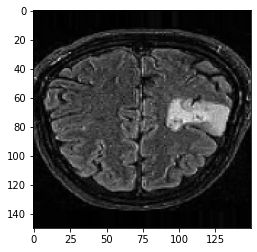

Brain Tumor


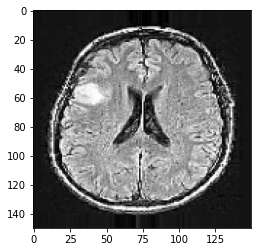

Brain Tumor


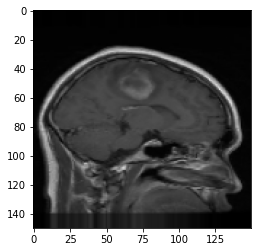

Brain Tumor


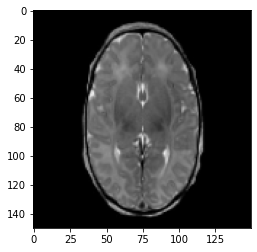

Healthy


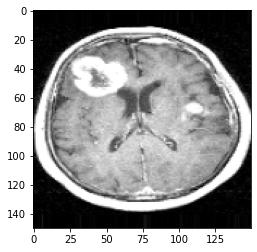

Brain Tumor


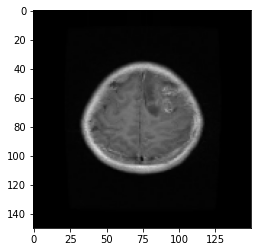

Brain Tumor


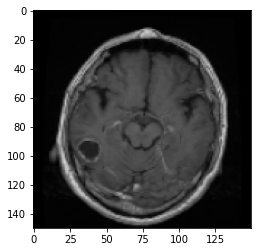

Brain Tumor


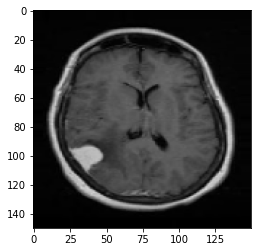

Brain Tumor


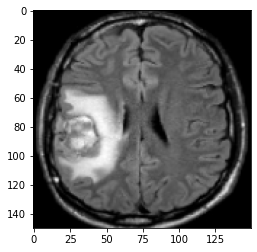

Brain Tumor


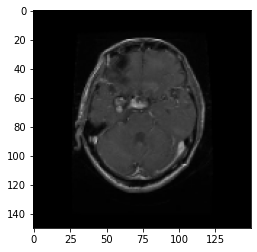

Brain Tumor


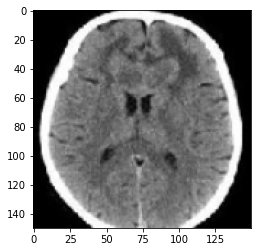

Healthy


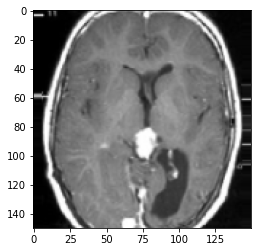

Brain Tumor


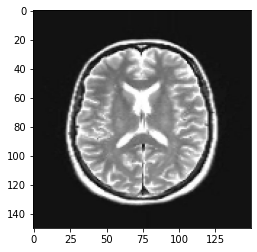

Healthy


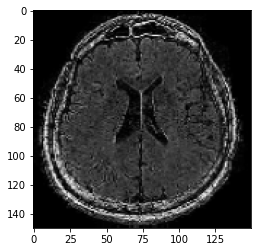

Healthy


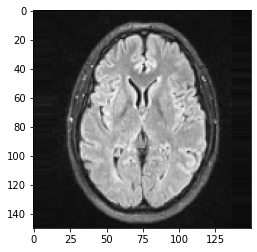

Healthy


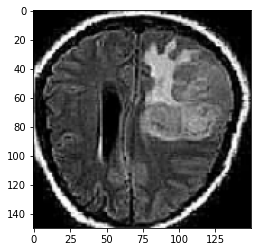

Brain Tumor


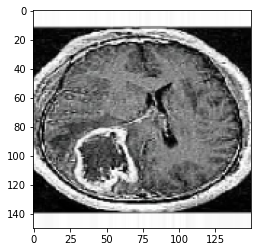

Brain Tumor


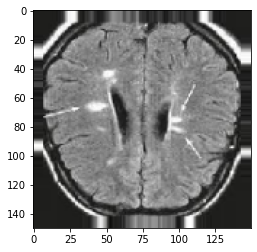

Healthy


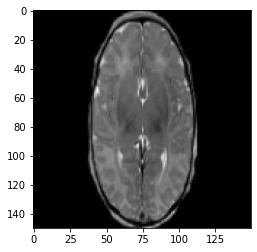

Healthy


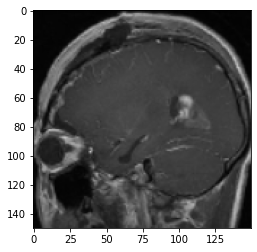

Brain Tumor


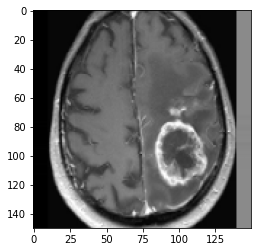

Brain Tumor


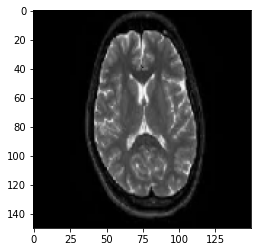

Healthy


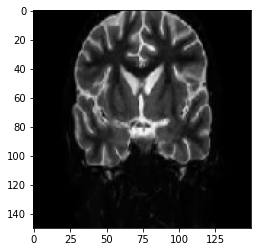

Healthy


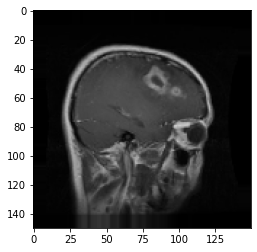

Brain Tumor


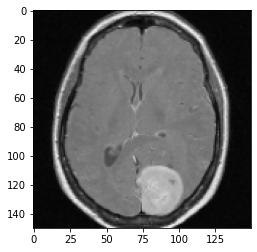

Brain Tumor


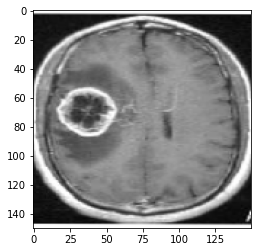

Brain Tumor


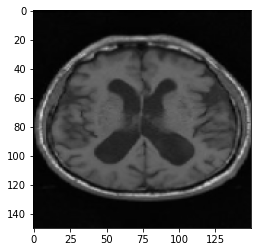

Healthy


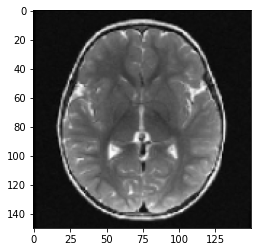

Healthy


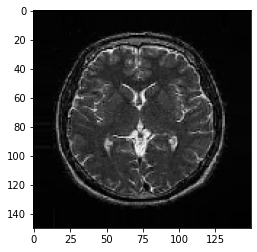

Healthy


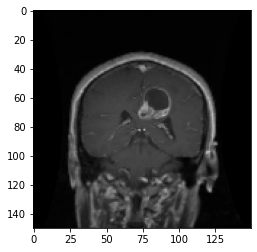

Brain Tumor


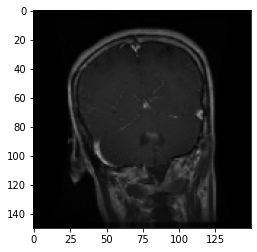

Brain Tumor


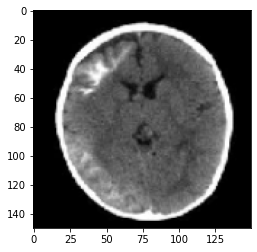

Healthy


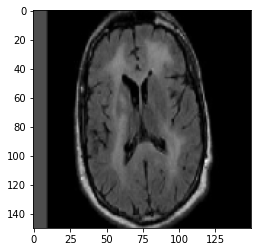

Healthy


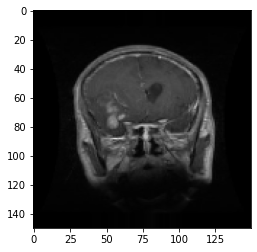

Brain Tumor


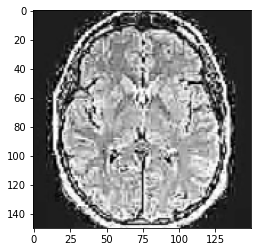

Healthy


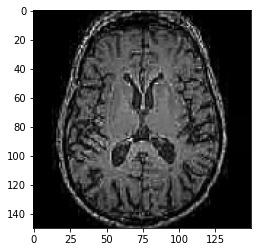

Healthy


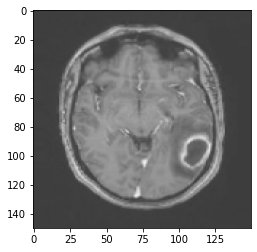

Brain Tumor


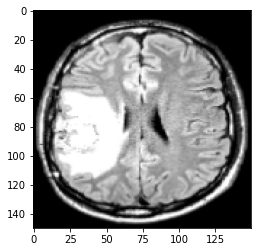

Brain Tumor


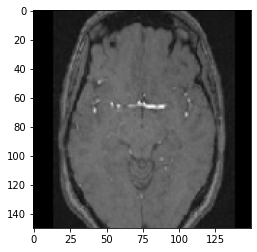

Healthy


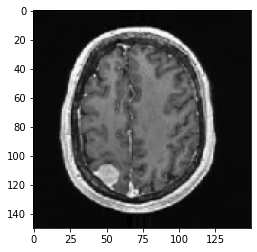

Brain Tumor


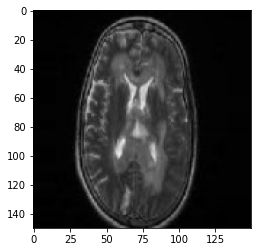

Healthy


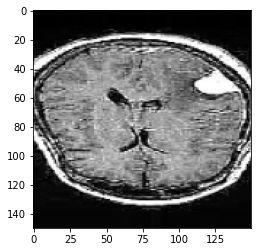

Brain Tumor


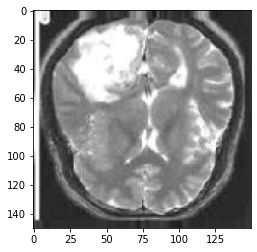

Brain Tumor


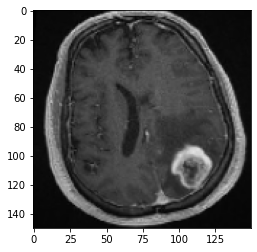

Brain Tumor


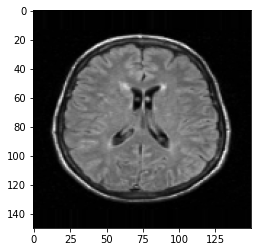

Healthy


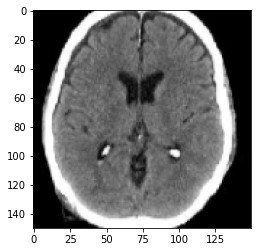

Healthy


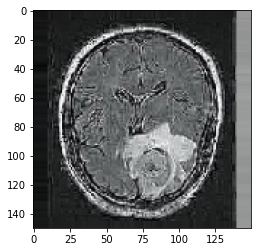

Brain Tumor


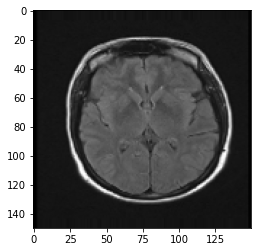

Healthy


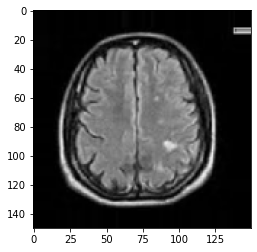

Healthy


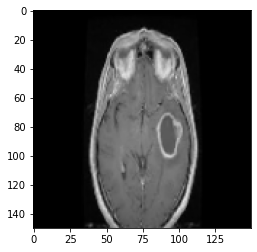

Brain Tumor


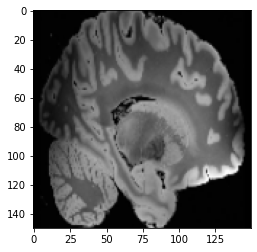

Healthy


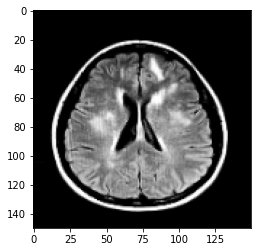

Healthy


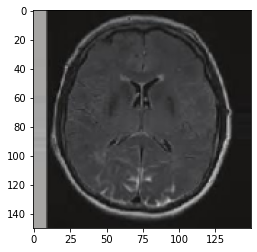

Healthy


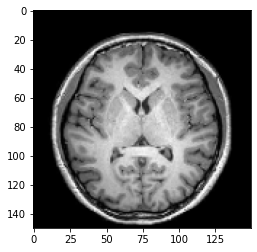

Healthy


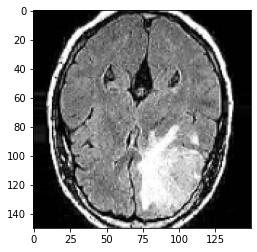

Brain Tumor


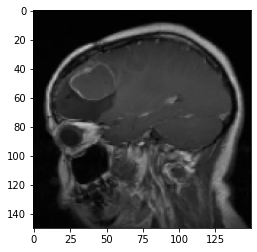

Brain Tumor


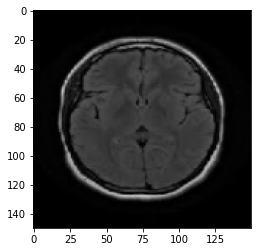

Healthy


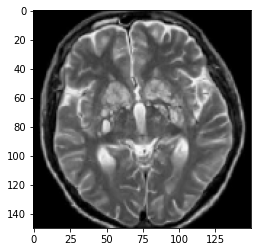

Healthy


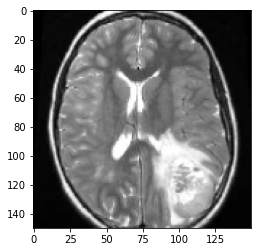

Brain Tumor


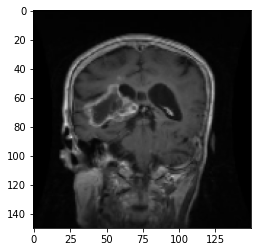

Brain Tumor


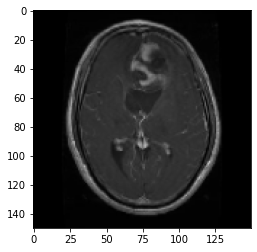

Brain Tumor


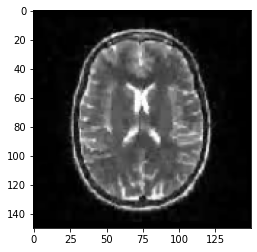

Healthy


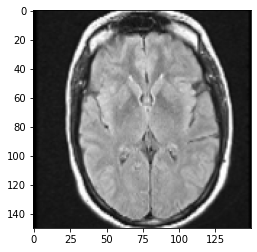

Healthy


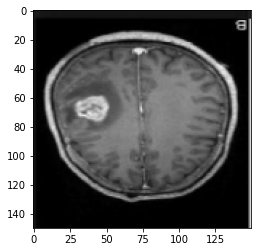

Brain Tumor


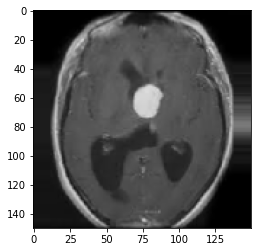

Brain Tumor


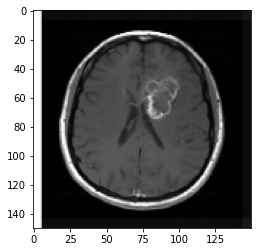

Brain Tumor


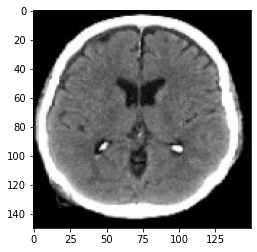

Healthy


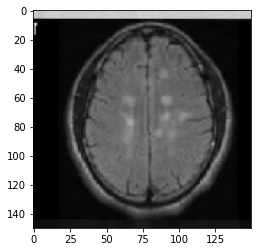

Healthy


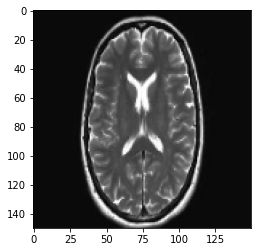

Healthy


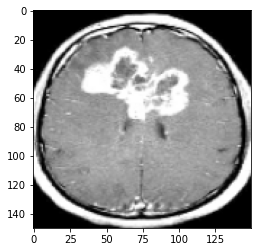

Brain Tumor


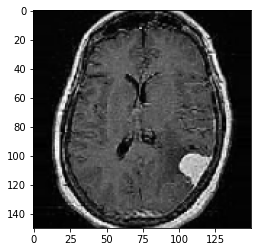

Brain Tumor


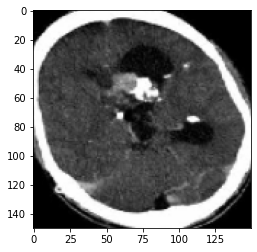

Healthy


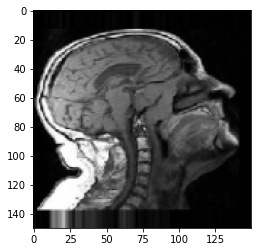

Healthy


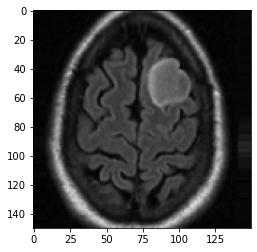

Brain Tumor


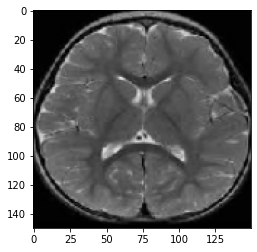

Healthy


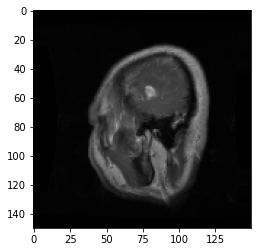

Brain Tumor


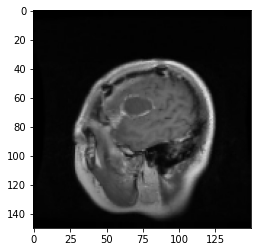

Brain Tumor


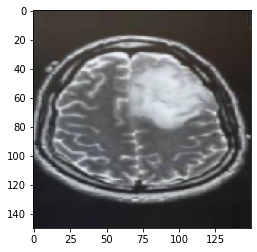

Brain Tumor


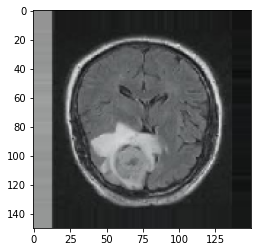

Brain Tumor


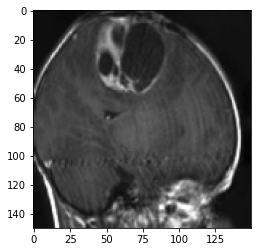

Brain Tumor


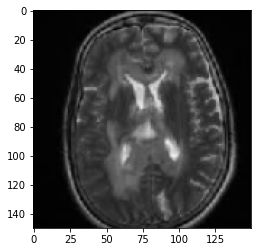

Healthy


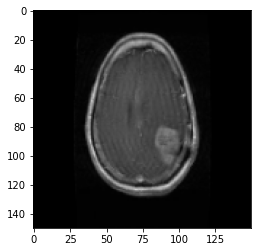

Brain Tumor


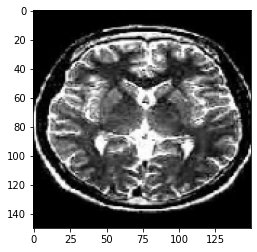

Healthy


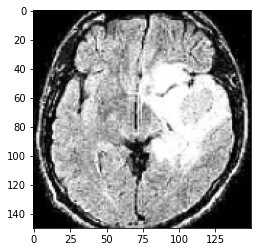

Brain Tumor


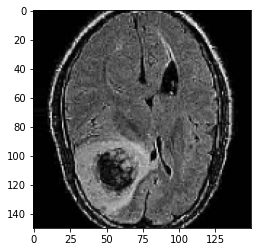

Brain Tumor


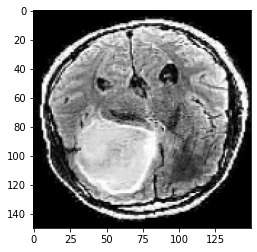

Brain Tumor


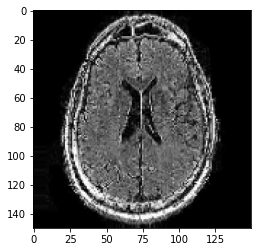

Healthy


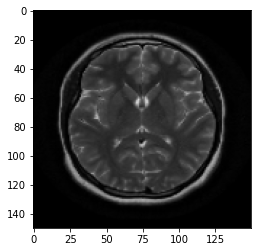

Healthy


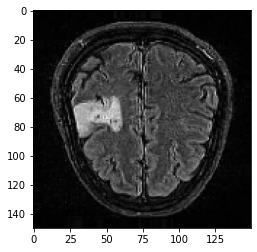

Brain Tumor


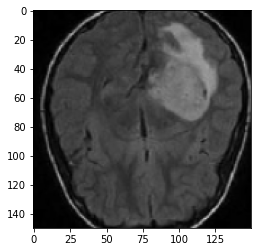

Brain Tumor


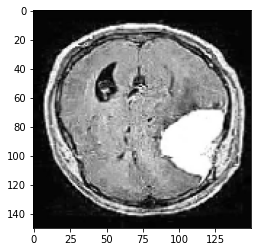

Brain Tumor


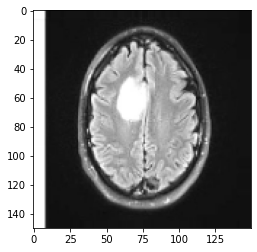

Brain Tumor


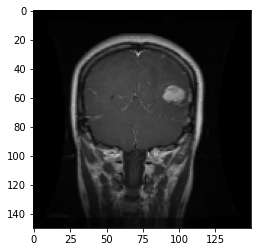

Brain Tumor


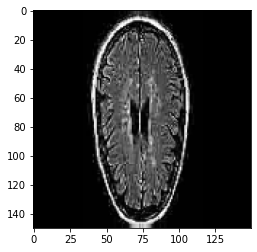

Healthy


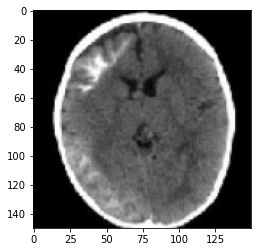

Healthy


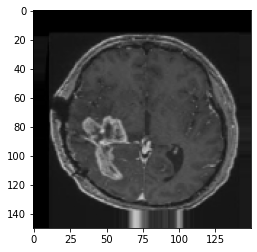

Brain Tumor


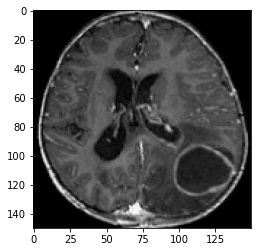

Brain Tumor


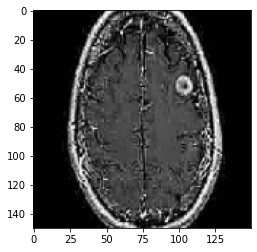

Brain Tumor


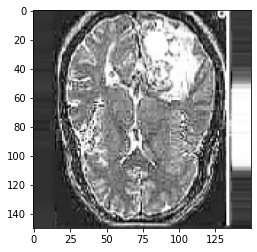

Brain Tumor


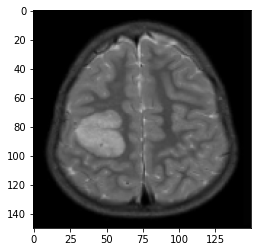

Brain Tumor


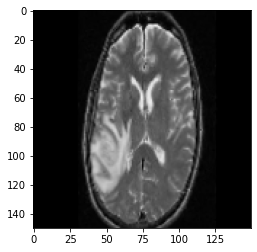

Brain Tumor


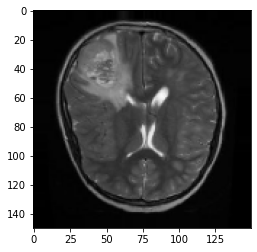

Brain Tumor


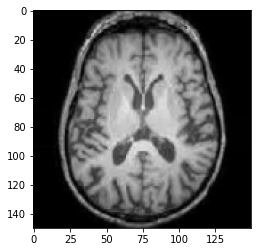

Healthy


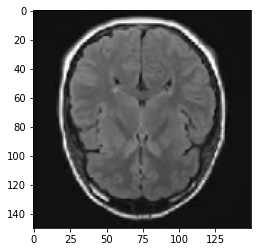

Healthy


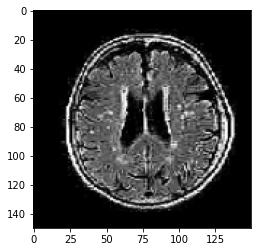

Healthy


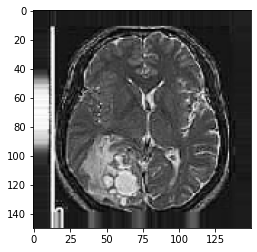

Brain Tumor


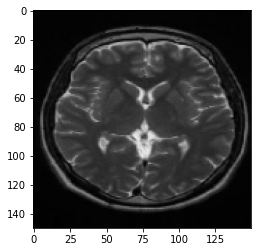

Healthy


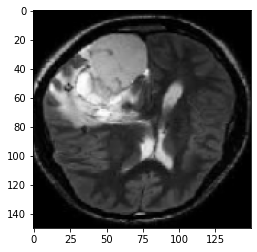

Brain Tumor


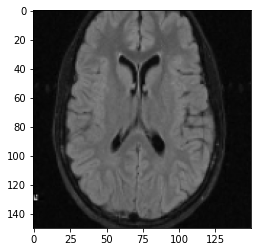

Healthy


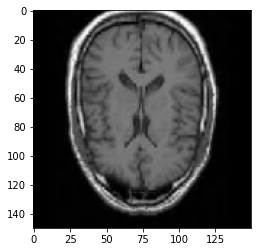

Healthy


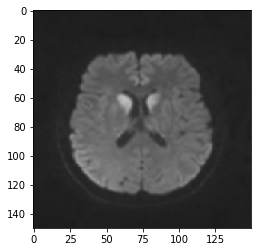

Healthy


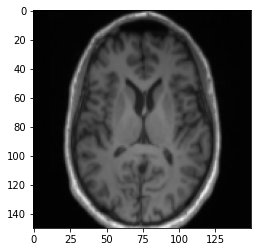

Healthy


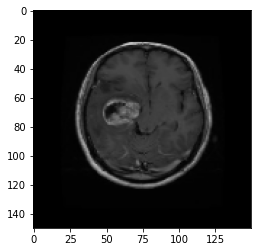

Brain Tumor


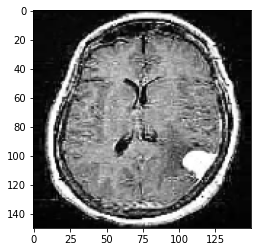

Brain Tumor


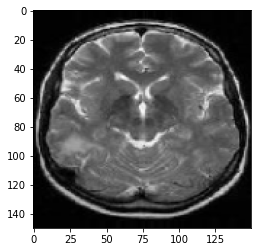

Healthy


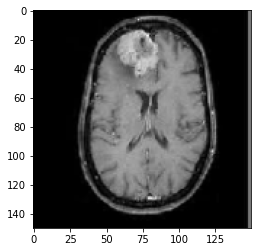

Brain Tumor


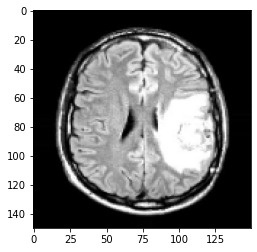

Brain Tumor


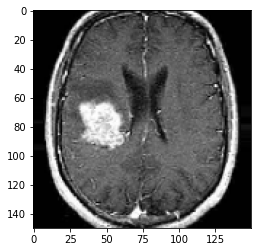

Brain Tumor


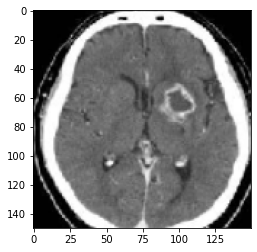

Brain Tumor


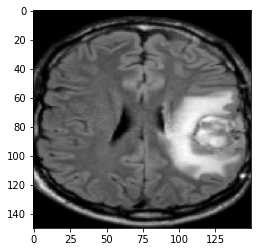

Brain Tumor


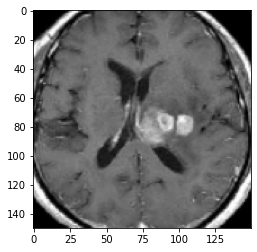

Brain Tumor


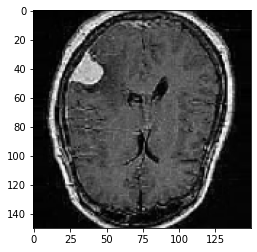

Brain Tumor


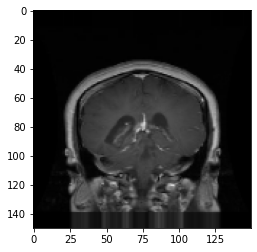

Brain Tumor


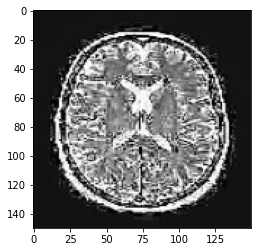

Healthy


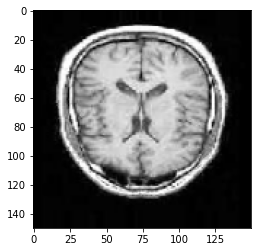

Healthy


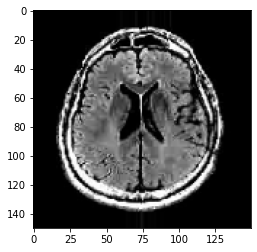

Healthy


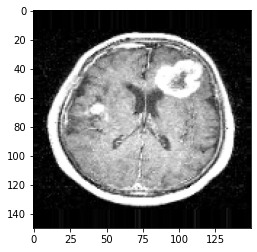

Brain Tumor


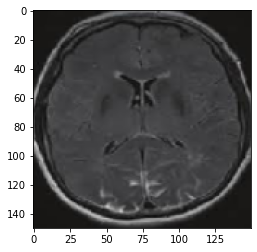

Healthy


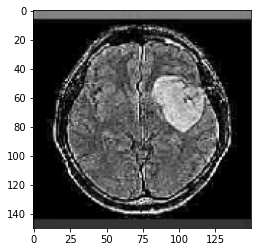

Brain Tumor


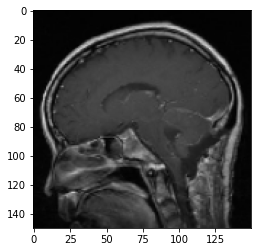

Brain Tumor


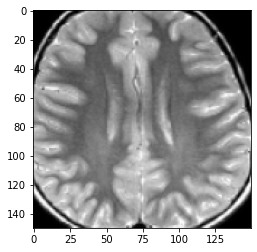

Healthy


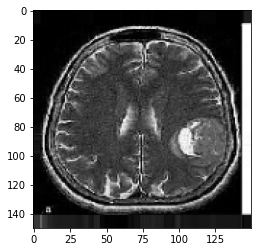

Brain Tumor


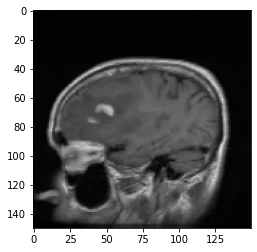

Brain Tumor


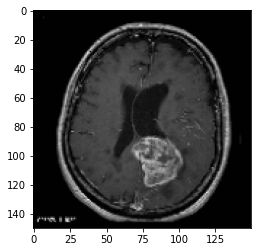

Brain Tumor


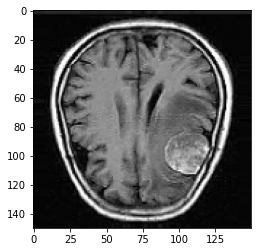

Brain Tumor


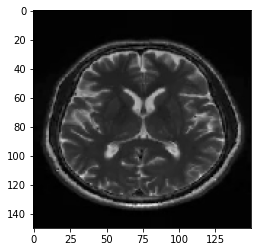

Healthy


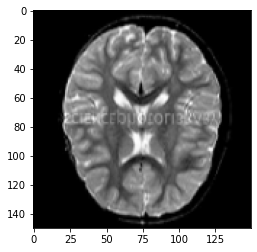

Healthy


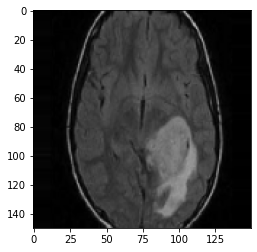

Brain Tumor


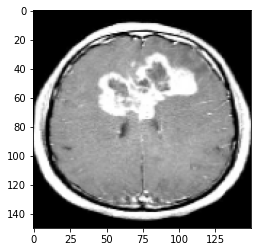

Brain Tumor


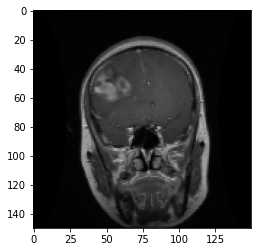

Brain Tumor


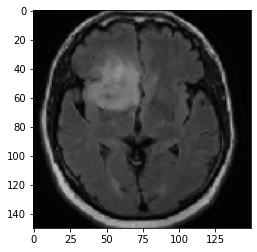

Brain Tumor


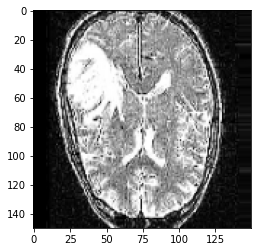

Brain Tumor


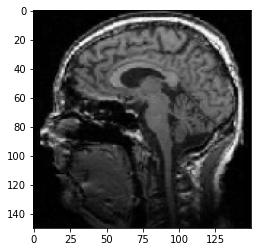

Healthy


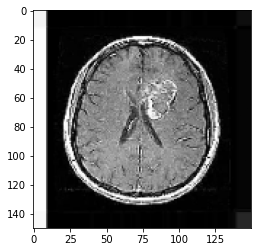

Brain Tumor


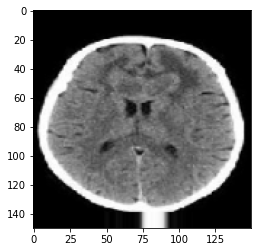

Healthy


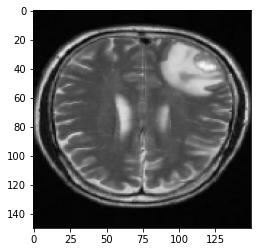

Brain Tumor


In [11]:
c = ['Brain Tumor', 'Healthy']
# Viewing the images in a batch 
for batch in train_generator:
    images = batch[0]
    labels = batch[1] # 0 = healthy 1 = Brain_Tumor
    for i in range(len(labels)):
        #displays an image and its label
        plt.imshow(images[i])
        plt.show()
        idx = labels[i]
        print(c[int(idx)])
    break # for a single batch of 256 images

# 4. Model

modifying vgg16 model 
(https://towardsdatascience.com/step-by-step-vgg16-implementation-in-keras-for-beginners-a833c686ae6c)

Made 3 different models until had (and settled on) the best one with 90% train accuracy

In [12]:
# Make model wide and deep enough that they work well, 
# but no wider and deeper.
model = Sequential()

# input shape is 150 x 150 x 3
# adapted model to impliment batch normalizaiton
model.add(Conv2D(input_shape=(150,150,3),filters=32,kernel_size=(3,3),padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

model.add(Flatten())

model.add(Dense(units=128,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))
model.add(Dense(units=128,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))
model.add(Dense(units=64,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))

model.add(Dense(units=1, activation="sigmoid"))

opt = Adam(learning_rate=0.001)

# changed loss from categorical_crossentropy to binary_crossentropy)
# since its a binary problem 
model.compile(optimizer=opt, loss=keras.losses.binary_crossentropy, metrics=['accuracy'])

model.summary()

Metal device set to: Apple M1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 37, 37, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 87616)             0         
                                                                 
 dense (Dense)            

2022-04-07 14:21:34.391415: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-04-07 14:21:34.391819: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [13]:
earlystopping = callbacks.EarlyStopping(monitor="val_loss", mode="min", 
                                        patience=5, restore_best_weights = True)

# 5. Training

In [14]:
hist = model.fit(train_generator, callbacks = [earlystopping], validation_data = validation_generator,
                           epochs=30)

Epoch 1/30


2022-04-07 14:21:35.466373: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-04-07 14:21:35.829754: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - ETA: 0s - loss: 0.7361 - accuracy: 0.5951

2022-04-07 14:21:52.655338: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 18s 1s/step - loss: 0.7361 - accuracy: 0.5951 - val_loss: 0.7720 - val_accuracy: 0.5894
Epoch 2/30
15/15 [==============================] - 18s 1s/step - loss: 0.5925 - accuracy: 0.6838 - val_loss: 0.6350 - val_accuracy: 0.6056
Epoch 3/30
15/15 [==============================] - 17s 1s/step - loss: 0.4946 - accuracy: 0.7608 - val_loss: 0.5151 - val_accuracy: 0.7932
Epoch 4/30
15/15 [==============================] - 16s 993ms/step - loss: 0.4095 - accuracy: 0.8046 - val_loss: 0.5299 - val_accuracy: 0.7238
Epoch 5/30
15/15 [==============================] - 17s 1s/step - loss: 0.3988 - accuracy: 0.8187 - val_loss: 0.8631 - val_accuracy: 0.5997
Epoch 6/30
15/15 [==============================] - 16s 1s/step - loss: 0.3573 - accuracy: 0.8392 - val_loss: 0.5613 - val_accuracy: 0.7046
Epoch 7/30
15/15 [==============================] - 16s 1s/step - loss: 0.3247 - accuracy: 0.8584 - val_loss: 0.4589 - val_accuracy: 0.7991
Epoch 8/30
15/15 [==========

# 6. Analysis & Conclusion

## Evaluate the model
https://www.tensorflow.org/tutorials/images/cnn

 **Model Predictions**

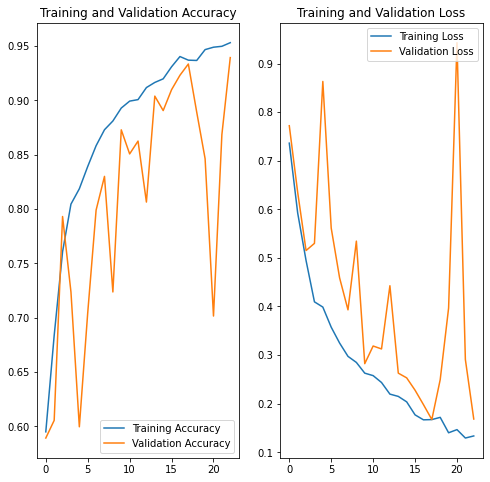

In [48]:
early_stop_epoch = 23

acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']

loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs_range = range(early_stop_epoch)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [73]:
test_loss, test_acc = model.evaluate(test_generator, verbose = 1)

1/1 [==============================] - 1s 706ms/step - loss: 0.1941 - accuracy: 0.9119


In [27]:
print("Test Accuracy")
print(test_acc)
print("\nTest Loss")
print(test_loss)

Test Accuracy
0.9118943214416504

Test Loss
0.19410403072834015


CNN has achieved a test accuracy of over 90%.

In [86]:
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred, axis=1)

conf_mat = confusion_matrix(test_generator.classes, y_pred)

In [89]:
print(conf_mat)

TP = conf_mat[1, 1]
TN = conf_mat[0, 0]
FP = conf_mat[0, 1]
FN = conf_mat[1, 0]

print (TP, TN, FP, FN)

[[122   0]
 [105   0]]
0 122 0 105


In [88]:
from sklearn import metrics
# use float to perform true division, not integer division
print((TP + TN) / float(TP + TN + FP + FN))
print(metrics.accuracy_score(test_generator.classes, y_pred))

0.5374449339207048
0.5374449339207048
